# Práctica 4: Tarea de clasificación

## Vladimir García Loginova

## Instrucciones

La cuarta práctica consiste en realizar una tarea de clasificación para predecir los estados de los vuelos con datos históricos reales. El dataset provisto deberá ser analizado respecto a los siguientes requerimientos:
Limpieza de datos.
Análisis exploratorio de los datos.
Procesamiento de datos.
Extracción y selección de características.
Reducción de dimensionalidad.
Evaluación 'interna' con al menos 10 algoritmos de inferencia.
Reportar los resultados con las siguientes métricas: (i) F1-score macro, (ii) sensibilidad, y (iii) especificidad; además de mostrar las respectivas matrices de confusión. 
Dado que el tema central de la unidad es la clasificación automática, se deberán evaluar exhaustivamente los siguientes algoritmos shallow (no utilizar algoritmos basados en aprendizaje profundo):
Aprendizaje basado en árboles de decisión (e.g. C4.5)
Aprendizaje Bayesiano (e.g. Naive Bayes)
Aprendizaje basado en instancias (e.g. kNN)
Máquinas de soporte vectorial (SVM)
Seis algoritmos de inferencia adicionales.

#### Descripicpon de atributos

- FL_DATE: Fecha del vuelo
- OP_CARRIER: Identificador de la aerolínea
- OP_CARRIER_FL_NUM: Número de vuelo
- ORIGIN: Código del aeropuerto de origen
- DEST: Código del aeropuerto de destino
- CRS_DEP_TIME: Hora planeada de salida
- DEP_TIME: Hora actual de salida
- DEP_DELAY: Retraso en la salida en minutos
- TAXI_OUT: El tiempo transcurrido entre la salida desde el aeropuerto de origen y el atributo "WHEELS_OFF"
- WHEELS_OFF: Hora a la que las llantas del avión dejaron de tocar el suelo
- CRS_ARR_TIME: Hora planeada de llegada
- ARR_DELAY: Retraso total en la llegada en minutos (atributo a predecir)
- CRS_ELAPSED_TIME: Tiempo total planeado del vuelo
- DISTANCE: Distancia entre los dos aeropuertos

### Importe de paqueterías

In [28]:
# importe de pauqterías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
from umap import UMAP
from datetime import datetime
from sklearn.preprocessing import LabelEncoder
import time
import datetime
from sklearn.metrics import f1_score,recall_score,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE

### Lectura de dataset

In [29]:
file="train_airlines_delay_challenge.csv"
df=pd.read_csv(file)
print("columnas:",df.columns.values)
print(df)


columnas: ['FL_DATE' 'OP_CARRIER' 'OP_CARRIER_FL_NUM' 'ORIGIN' 'DEST' 'CRS_DEP_TIME'
 'DEP_TIME' 'DEP_DELAY' 'TAXI_OUT' 'WHEELS_OFF' 'CRS_ARR_TIME' 'ARR_DELAY'
 'CRS_ELAPSED_TIME' 'DISTANCE']
            FL_DATE OP_CARRIER  OP_CARRIER_FL_NUM ORIGIN DEST  CRS_DEP_TIME  \
0        2009-09-05         AA               2062    MIA  BOS        1055.0   
1        2009-05-08         XE               2926    IAH  ELP        2115.0   
2        2009-03-16         OH               6433    CVG  DSM        1430.0   
3        2009-03-04         OO               5439    LAX  SBA         820.0   
4        2009-06-12         WN                615    LAS  MCI        1235.0   
...             ...        ...                ...    ...  ...           ...   
8999995  2017-10-27         WN               4233    PDX  SMF        2025.0   
8999996  2017-01-06         OO               4482    SEA  SMF        2105.0   
8999997  2017-09-24         WN               3997    DEN  SNA        1400.0   
8999998  2017-07-2

### Limpieza de datos

Se eliminan duplicados

In [30]:
df2=df.drop_duplicates()
print("número de duplicados=",df.shape[0]-df2.shape[0])

número de duplicados= 27522


### Análisis exploratorio

Como el dataset es muy grande haremos un análisis exploratorio con una muestra, correspondiente al 10 % de los datos.

In [31]:
df_sample=df2.sample(frac=0.1)
print(df_sample.shape)

(897248, 14)


Hacemos pairplot para analizar los datos

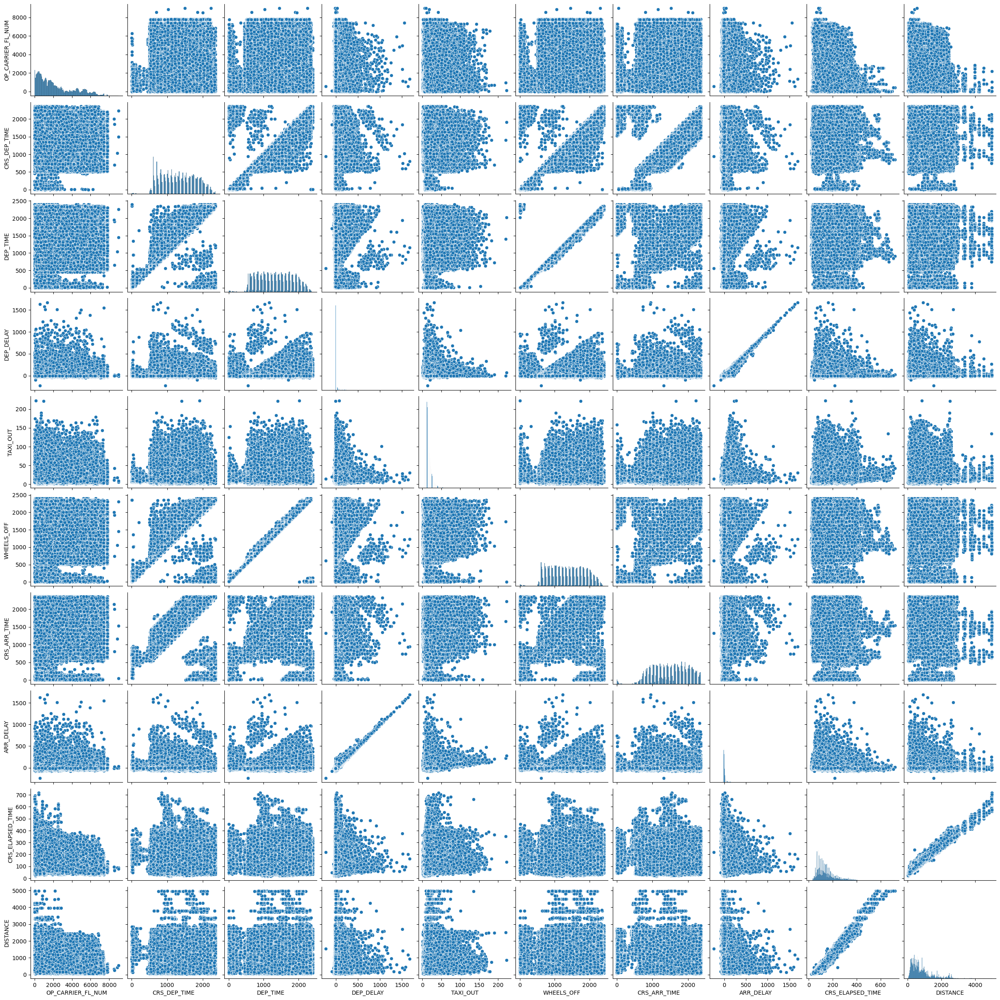

In [32]:
sns.pairplot(df_sample)

#### Analizamos algunas de las variables:

1. OP_CARRIER_FL_NUM.
   
   Esta variable corresponde el número de vuelo. Muestra algunos clusters de datos respecto a otras variables. Respecto a la hora planeada de salida, por ejemplo, hay un cluster de vuelos donde antes de las 05 h solo salen vuelos con un numero de vuelo menor a 3000. Respecto a las variables de hora actual de salida, Wheels_off y hora planeada de llegada, también hay un cluster antes de las 05 h, donde se observa que entre 02 y 05 h el numero de vuelos decrece, dejando solo vuelos existentes con un número de vuelo debajo de 3000.
   
2. CRS_DEP_TIME.
   
   Esta variable corresponde a la hora planeada de salida. Respecto a las variables de hora de salida actual, Wheels_off y hora planeada de llegada, se observa un patrón lineal (directamente proporcional), que es logico por la dependendencia entre variables. Sin embargo, hay algunos clusters de datos que se salen del patrón lineal, que seguramente corresponen a vuelos que llegaron antes o despues de lo planeado.

   Conforme a las variables de retraso de salida (DEP_DELAY) y llegada (ARR_DELAY), se observa un retraso grande en vuelos que salen en la mañana (desde las 5 am aprox), que posteriormente esta cantidad de vuelos decrece de forma lineal hasta las 23:59 h. Hay un cluster de vuelos entre aproximadamente las 15 h y las  23:59 h en el que el retraso es mayor, pero también presenta un decremento lineal. Entre las 00 h y las 05 h, aparentemente no hay muchos vuelos ni un patrón.

   Respecto a todas las demás variables, no hay una relación lineal aparente, y lo único notorio es el pequeño cluster observado debajo de las 05 h que tiene muy pocos vuelos.

3. DEP_TIME

   Esta variable corresponde a la hora real de salida. Respecto a las variables de retraso de salida (DEP_DELAY) y de llegada (ARR_DELAY), podemos ver un patrón ya observado. Después de las 5 am, el retraso en la hora de salida (o llegada) incrementa hasta las 23:59 h. Y al contrario, entre las 00 h y las 05 h el retraso disminuye (ligeramente). Y se observa otro cluster de datos donde el retraso es mayor y también incrementa desde las 05 h hasta las 13 h aproximadamente.

   Conforme a la variable Wheels_off se observa un comportamiento bastante lineal y ajustado, que es lógico debido a la dependencia entre ambas variables. Se nota un cluster de datos que no estan dentro del comportamiento general, y que posiblemente son retrasos o adelantos.


   Respecto a la otras variables (excepto Wheels_off) se ven patrones ya vistos anteriormente, excepto en su relación con la variable de hora estimada de llegada (CRS_ARR_TIME), donde, aunque parece que si hay una relacion lineal (directamente proporcional), hay clusters de datos que no se ajustan a esta relación. Por ejemplo  entre las 15 y 23:59 h, hay dos clusters de datos debajo de las 10 h, que no se comportan como los demás datos, es posible que esto indica un retraso en los vuelos.


5. DEP_DELAY

   Esta variable describe el retraso de salida en minutos. Ya vimos como se comportan la mayoría de variables respecto a esta variable. Por lo que analizamos las nuevas relaciones encontradas.

   Respecto a la variable de Taxi_out vemos que hay una relación directa decreciente pero que no necesariamente es lineal (parece que sigue un modelo de ley potencial), y que tiene mucho sentido, porque la hora en que las llantas dejaron de tocar el suelo esta relacionado con el retraso de salida del vuelo. Entonces entre más se retrase el vuelo más es el timepo transcurrido entre la hora a la que el avión salió de su puerta y la hora que despegó.

   Conforme a las variables WHEELS_OFF y  DEP_TIME, se observan 3 cluster de datos. En el primero, hay un decremento aparentemente lineal hasta las 5 am, en el segundo hay un incremento lineal despues de las 5 am y hasta las 23:59. En el tercero también hay un incremento lineal entre las 5 y 15 h aproximadamente, pero con un mayor retraso.

   Repecto a las variables de tiempo total planeado de vuelo y distancia del viaje se observa una relación decreciente (aparentemente lineal). Esto quiere decir que entre más largo es el vuelo, más probabilidad hay de que se retrase.

   Hay una relación lineal y ajustada con la variable ARR_DELAY, correspondiente al retraso en la hora de llegada. Esta relación es esperada, ya que, si se atrasa el vuelo en la salida, muy probablemente llegará atrasado también.

Con las 4 variables analizadas se expusieron la mayoría de relaciones existentes en el dataset (exluyendo las variables de códigos de aeropuerto destino u origen). 

La variable objetivo ARR_DELAY se comporta de la misma forma que la variable DEP_DELAY en todos los casos, con muy ligeras variaciones por variable.

En muchas variables se observan cuellos de botella cerca de las 5 am, esto nos dice simplemente que no hay muchos vuelos a esa hora.

Estos análisis serán de ayuda para ver que características son útiles para la clasifiación.


Usamos otra muestra del dataset, para ver si se repite el patron visto, y asegurar que no hay sesgo.

In [33]:
random_indexes=np.random.randint(int(df2.shape[0]), size=int(df2.shape[0]*0.1))
df_sample2=df2[df2.index.isin(random_indexes)]

Hacemos nuevamente pairplot

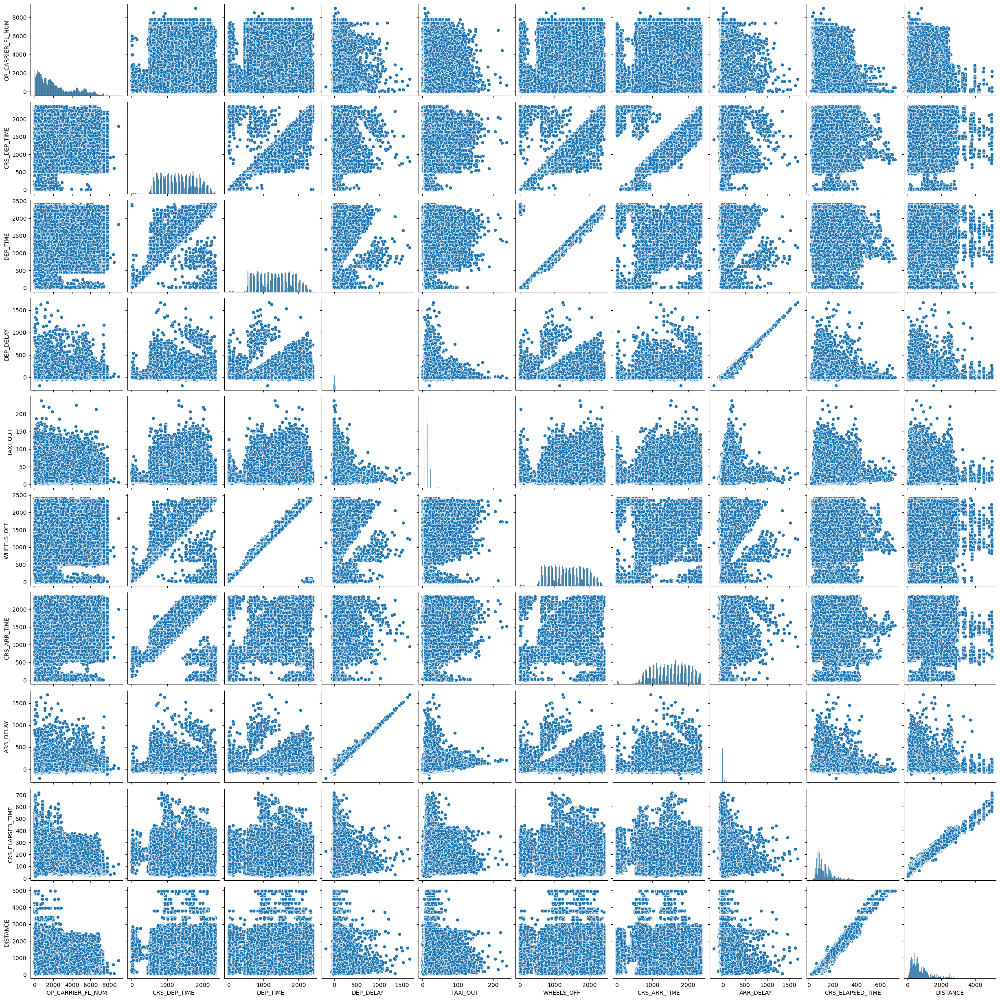

In [34]:
sns.pairplot(df_sample2)

Se observa el mismo comportamiento, por lo que podemos confiar en los análisis hechos con una muestra del dataset.

#### Convertimos a valores númericos las variables de etiqueta ORIGIN y DEST

In [35]:
# Para este caso haremos una conversión manual de las etiquetas a integers, para que tanto en el aeropuerto origen y destino se tenga el
# mismo label para cada código
origin_uni=sorted(df2.ORIGIN.unique())
dest_uni=sorted(df2.DEST.unique())

print("Número de códigos en origen:",len(origin_uni))
print("Número de códigos en destino:",len(dest_uni))
#la variable origin tiene 352 codigos, mientras que dest 351, vemos si  todos los valores de destino esten en origen
dest_in_ori=np.isin(dest_uni,origin_uni)
# el metodo all te dice si todos los elementos son verdadero, en este caso asi fue
print("Los códigos de origen abarcan a los de destino:", all(dest_in_ori))

origin_num=np.arange(len(origin_uni))
#escogemos origin como nuestro vector base para enumerar nuestros labels
origin_dic={origin_uni[i]:origin_num[i] for i in range(len(origin_uni))}

origin_int=[]
dest_int=[]
for i in range(len(df2.ORIGIN.values)):
    origin_int.append(origin_dic[df2.ORIGIN.values[i]])
    dest_int.append(origin_dic[df2.DEST.values[i]])
origin_int=np.array(origin_int)
dest_int=np.array(dest_int)

# insertamos columna
df2=df2.assign(ORIGIN_num=origin_int, DEST_num=dest_int)
df2.head()

Número de códigos en origen: 352
Número de códigos en destino: 351
Los códigos de origen abarcan a los de destino: True


,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,CRS_ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_num,DEST_num
0,2009-09-05,AA,2062,MIA,BOS,1055.0,1139.0,44.0,15.0,1154.0,1405.0,30.0,190.0,1258.0,220,42
1,2009-05-08,XE,2926,IAH,ELP,2115.0,2112.0,-3.0,17.0,2129.0,2219.0,-15.0,124.0,667.0,162,108
2,2009-03-16,OH,6433,CVG,DSM,1430.0,1425.0,-5.0,25.0,1450.0,1518.0,7.0,108.0,505.0,84,100
3,2009-03-04,OO,5439,LAX,SBA,820.0,814.0,-6.0,15.0,829.0,905.0,-11.0,45.0,89.0,190,296
4,2009-06-12,WN,615,LAS,MCI,1235.0,1234.0,-1.0,13.0,1247.0,1735.0,-26.0,180.0,1140.0,188,209


Ahora graficamos el aeropuerto origen respecto al retraso del vuelo en origen, y también graficamos las medianas

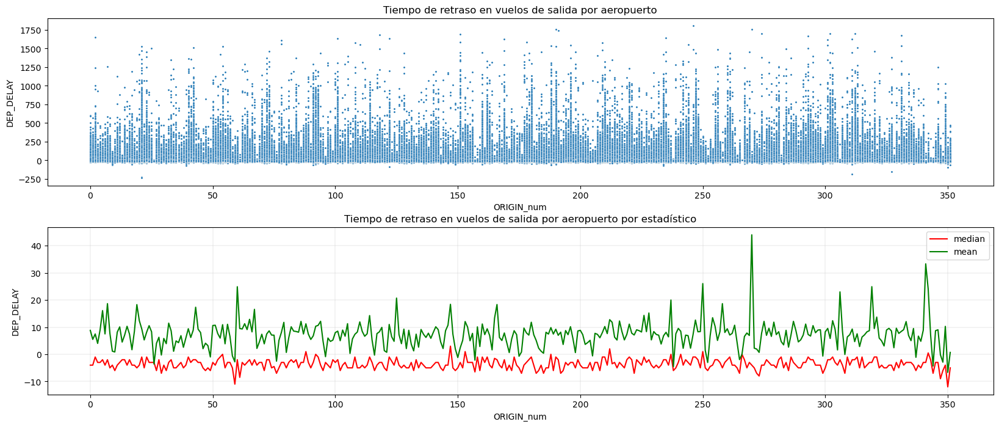

In [36]:
df4=df2[["DEP_DELAY","ORIGIN_num"]]
#df4_sample=df4.sample(frac=0.5,replace=False, random_state=1)
median_delay=df4.groupby(["ORIGIN_num"]).median()
mean_delay=df4.groupby(["ORIGIN_num"]).mean()
fig = plt.figure(figsize=(20,8))
plt.subplot(211)
sns.scatterplot(data=df4,x=df4.ORIGIN_num, y=df4.DEP_DELAY,s=5)
plt.title("Tiempo de retraso en vuelos de salida por aeropuerto")
plt.subplot(212)
plt.plot(median_delay.DEP_DELAY.values,color='red',label="median")
plt.plot(mean_delay.DEP_DELAY.values,color='green',label="mean")
plt.title("Tiempo de retraso en vuelos de salida por aeropuerto por estadístico")
plt.legend()
plt.xlabel("ORIGIN_num")
plt.ylabel("DEP_DELAY")
plt.grid(True,lw=0.2)
plt.subplots_adjust(hspace=0.25)
plt.show()

La mediana muestra tiempos de salida menores a 0 en la mayoría de casos, pero muy cercano a los -5 minutos en la mayoría de los casos. Por otro lado se observan muy pocas salidas encima del 0, es decir que se retrasan poco los vuelos de salida. La media muestra lo contrario, con la mayoría de aeropuertos con un pequeño retraso (~10 min) en su salida, y mas sesgo en algunos picos, posiblemente por retrasos exagerados en algun vuelos. 

Hacemos lo mismo entre el aeropuerto de llegada y el retraso en la llegada

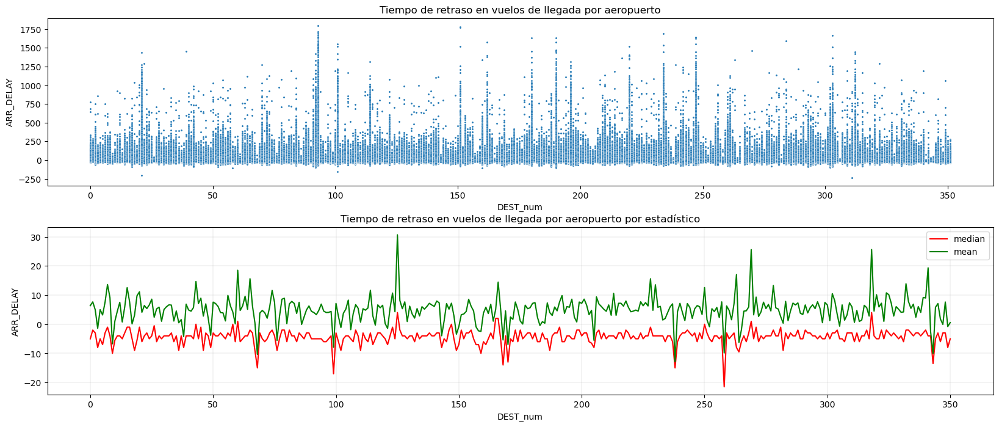

In [37]:
df4=df2[["ARR_DELAY","DEST_num"]]
median_delay=df4.groupby(["DEST_num"]).median()
mean_delay=df4.groupby(["DEST_num"]).mean()
fig = plt.figure(figsize=(20,8))
plt.subplot(211)
sns.scatterplot(data=df4,x=df4.DEST_num, y=df4.ARR_DELAY,s=5)
plt.title("Tiempo de retraso en vuelos de llegada por aeropuerto")
plt.subplot(212)
plt.plot(median_delay.ARR_DELAY.values,color='red',label="median")
plt.plot(mean_delay.ARR_DELAY.values,color='green',label="mean")
plt.title("Tiempo de retraso en vuelos de llegada por aeropuerto por estadístico")
plt.legend()
plt.xlabel("DEST_num")
plt.ylabel("ARR_DELAY")
plt.grid(True,lw=0.2)
plt.subplots_adjust(hspace=0.25)
plt.show()

Aquí se nota el mismo compartamiento entre media y mediana que con el retraso en la salida. Se observan algunos valles importantes, posiblemente asociados a adelantos grandes en la llegada del vuelo o a un posible error de registro.

### Extracción y aumento de características

Convertimos el id de aerolínea a número

In [38]:
le = LabelEncoder()
op_carrier_num=le.fit_transform(df2.OP_CARRIER.values)
df2=df2.assign(OP_CARRIER_num=op_carrier_num)

Convertimos columna de strings a datetime-int y también creamos otra columna con los meses

In [39]:
fl_date_ts=pd.to_datetime(df["FL_DATE"],format='%Y-%m-%d')
fl_date_ts2=fl_date_ts.astype(int)/ 10**9
fl_month=fl_date_ts.dt.month
df3=df2.assign(FL_DATE_ts=fl_date_ts2).assign(FL_DATE_month=fl_month).assign(FL_DATE_month=fl_month)


#### Se investigó y obtuvo un csv con la lista de los 350 aeropuertos con mayor número de pasajeros.
Los datos se preprocesaron para asignar 5 clases de aeropuerto basado en el número de pasajeros.

Se lee el dataset preprocesado.

In [40]:
file_air="air_traffic_usa.csv"
df_air=pd.read_csv(file_air)
df_air['Cant2'] = pd.to_numeric(df_air.Cant.str.replace(',', '.'), errors='coerce').astype(int)
df_air['Type2'] = pd.to_numeric(df_air.Type.str.replace(',', '.'), errors='coerce').astype(int)
df_air2=df_air.drop(columns=["Rank", "Cant", "Type", "Cant2"])
df_air.head()

,Rank,Locid,Cant,Type,Cant2,Type2
0,1,ATL,"4,54E+07","0,00E+00",45400000,0
1,2,DFW,"3,53E+07","0,00E+00",35300000,0
2,3,DEN,"3,38E+07","0,00E+00",33800000,0
3,4,ORD,"3,31E+07","0,00E+00",33100000,0
4,5,LAX,"3,23E+07","0,00E+00",32300000,0


Se quitan los aeropuertos que no estan en nuestro dataset y se agregan los que si, a los cuales se les asigna la clase de aeropuerto menos concurrido.

In [41]:

locid=df_air2.Locid.values
type2=df_air2.Type2.values

locid_in_origin=np.isin(locid,df3.ORIGIN.unique())

#mascaras booleanas
locid2=list(locid[locid_in_origin==True])
busy_class=list(type2[locid_in_origin==True])

origin_in_locid=np.isin(df3.ORIGIN.unique(),locid2)
print(origin_in_locid.shape)

# Si no se encuentra en aeropuertos de dataset se agrega aeropuerto y se le asigna categoria 4 (poco concurrido)
for idx,i in enumerate(origin_in_locid):
    if not i :
        locid2.append(df3.ORIGIN.unique()[idx])
        busy_class.append(4)


d = {'Locid': locid2, 'Busy_class': busy_class}
df_air3 = pd.DataFrame(data=d)
print(df_air3)

(352,)
    Locid  Busy_class
0     ATL           0
1     DFW           0
2     DEN           0
3     ORD           0
4     LAX           0
..    ...         ...
347   DVL           4
348   PUB           4
349   PIB           4
350   UIN           4
351   CGI           4

[352 rows x 2 columns]


Se crea una columna con las clases de los aeropuertos por numero de pasajeros.

In [42]:
# Realizar el merge
df5 = df3.merge(df_air3, left_on='ORIGIN', right_on='Locid', how='left')

# Eliminar la columna 'a' si no la necesitas
df5 = df5.drop(columns=['Locid'])
df5.head()

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,CRS_ARR_TIME,ARR_DELAY,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_num,DEST_num,OP_CARRIER_num,FL_DATE_ts,FL_DATE_month,Busy_class
0,2009-09-05,AA,2062,MIA,BOS,1055.0,1139.0,44.0,15.0,1154.0,1405.0,30.0,190.0,1258.0,220,42,1,1.252109e+09,9,0
1,2009-05-08,XE,2926,IAH,ELP,2115.0,2112.0,-3.0,17.0,2129.0,2219.0,-15.0,124.0,667.0,162,108,19,1.241741e+09,5,0
2,2009-03-16,OH,6433,CVG,DSM,1430.0,1425.0,-5.0,25.0,1450.0,1518.0,7.0,108.0,505.0,84,100,13,1.237162e+09,3,1
3,2009-03-04,OO,5439,LAX,SBA,820.0,814.0,-6.0,15.0,829.0,905.0,-11.0,45.0,89.0,190,296,14,1.236125e+09,3,0
4,2009-06-12,WN,615,LAS,MCI,1235.0,1234.0,-1.0,13.0,1247.0,1735.0,-26.0,180.0,1140.0,188,209,18,1.244765e+09,6,0


#### Se crean más variables de interes

Se hacen las variables categóricas de ARR_DELAY y tambien de DEP_DELAY

In [43]:
#Variable categórica de ARR_DELAY con número
df5['ARR_DELAY_class_num'] = np.select([df5['ARR_DELAY'] < -15, df5['ARR_DELAY'] > 15], [0, 2], default=1)
#Variable categórica de ARR_DELAY con etiqueta
df5['ARR_DELAY_class_str'] = np.select([df5['ARR_DELAY'] < -15, df5['ARR_DELAY'] > 15], ["Early", "Delay"], default="On time")
#Variable categórica de DEP_DELAY con número, con la misma clasificación que ARR_DELAY
df5['DEP_DELAY_class_num'] = np.select([df5['DEP_DELAY'] < -15, df5['DEP_DELAY'] > 15], [0, 2], default=1)

Clasificamos por hora de salida en tres clases: antes de las 5, entre 5 y 10, y despues de las 10.

In [44]:
#Variable DEP_TIME por categoría de horario
df5['DEP_TIME_class_num'] = np.select( [(df5['DEP_TIME'] < 500) & (df5['DEP_TIME'] > 0),\
(df5['DEP_TIME'] >= 500) &  (df5['DEP_TIME'] < 1000)], [0, 1], default=2)
#Variable CRS_ARR_TIME por categoría de horario
df5['CRS_ARR_TIME_class_num'] = np.select( [(df5['CRS_ARR_TIME'] < 500) & (df5['CRS_ARR_TIME'] > 0),\
(df5['CRS_ARR_TIME'] >= 500) &  (df5['CRS_ARR_TIME'] < 1000)], [0, 1], default=2)

Se crea otra variable con una clasificacion mas fina de la variable DEP_DELAY.

In [45]:
#Variable DEP_DELAY con clasificación un poco más fina por retraso.
df5['DEP_DELAY_class_num2'] = np.select( [(df5['DEP_DELAY'].abs() < 5) ,(df5['DEP_DELAY'].abs() >= 5)\
                                         & (df5['DEP_DELAY'].abs() < 15),(df5['DEP_DELAY'].abs() >= 15)\
                                         &  (df5['DEP_DELAY'].abs() <50)]\
                                       ,[0,1,2,], default=3)

Debido a que en la variable DEP_DELAY_class_num el número de datos que caen dentro de la cataegoría "On time" exceden por muchos a los que caen en las otras dos categorías ("Early" y "Delay"), se hace un ajuste, disminuyendo los datos en la categoría "On time", para que el clasificador funcione mejor. Se quitan más de la mitad de los datos de la categoría "On time".


In [46]:
print("DEP_DELAY Early:",df5[df5['DEP_DELAY_class_num']==0].shape[0])
print("DEP_DELAY On time:",df5[df5['DEP_DELAY_class_num']==1].shape[0])
print("DEP_DELAY Delay:",df5[df5['DEP_DELAY_class_num']==2].shape[0])

# num de indices a recortar
n_delete = int(df5.shape[0]*0.5)
# indices que se quitan de forma aleatoria
ind_delete = df5[df5['DEP_DELAY_class_num']==1].sample(n=n_delete).index

#se obtiene nuevo dataframe con categorías mejor balanceadas
df6 = df5.drop(ind_delete)
print("DEP_DELAY On time finales:",df6[df6['DEP_DELAY_class_num']==1].shape[0])

df6.head()

DEP_DELAY Early: 28050
DEP_DELAY On time: 7392251
DEP_DELAY Delay: 1552177
DEP_DELAY On time finales: 2906012


,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,...,OP_CARRIER_num,FL_DATE_ts,FL_DATE_month,Busy_class,ARR_DELAY_class_num,ARR_DELAY_class_str,DEP_DELAY_class_num,DEP_TIME_class_num,CRS_ARR_TIME_class_num,DEP_DELAY_class_num2
0,2009-09-05,AA,2062,MIA,BOS,1055.0,1139.0,44.0,15.0,1154.0,...,1,1.252109e+09,9,0,2,Delay,2,2,2,2
1,2009-05-08,XE,2926,IAH,ELP,2115.0,2112.0,-3.0,17.0,2129.0,...,19,1.241741e+09,5,0,1,On time,1,2,2,0
3,2009-03-04,OO,5439,LAX,SBA,820.0,814.0,-6.0,15.0,829.0,...,14,1.236125e+09,3,0,1,On time,1,1,1,1
6,2009-06-04,EV,5421,FAY,ATL,1633.0,1653.0,20.0,8.0,1701.0,...,6,1.244074e+09,6,2,2,Delay,2,2,2,2
12,2009-06-23,MQ,4060,ORD,FNT,2105.0,2106.0,1.0,19.0,2125.0,...,10,1.245715e+09,6,0,1,On time,1,2,2,0


Se observa que la categoría Early en realidad tiene muy pocos registros.

### Procesamiento y evaluación

#### Matriz de correlacion

['OP_CARRIER_FL_NUM' 'CRS_DEP_TIME' 'DEP_TIME' 'DEP_DELAY' 'TAXI_OUT'
 'WHEELS_OFF' 'CRS_ARR_TIME' 'ARR_DELAY' 'CRS_ELAPSED_TIME' 'DISTANCE'
 'ORIGIN_num' 'DEST_num' 'OP_CARRIER_num' 'FL_DATE_ts' 'FL_DATE_month'
 'Busy_class' 'ARR_DELAY_class_num' 'DEP_DELAY_class_num'
 'DEP_TIME_class_num' 'CRS_ARR_TIME_class_num' 'DEP_DELAY_class_num2']


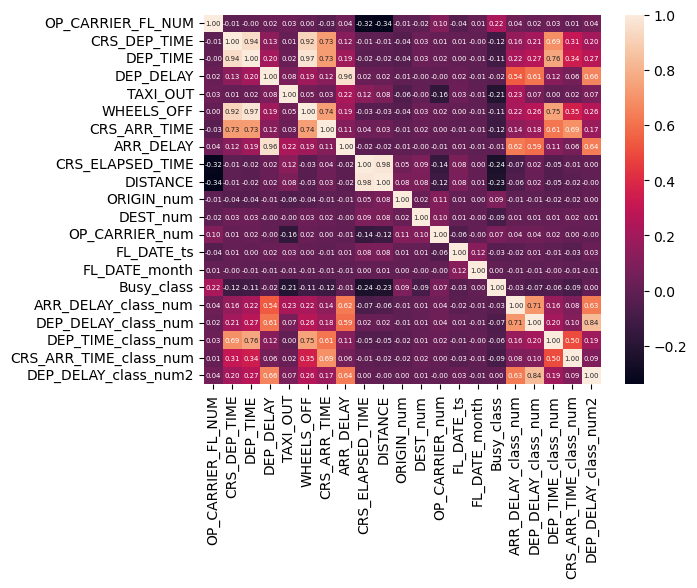

In [47]:
df_corr=df6.drop(columns=["FL_DATE","ORIGIN","DEST", "OP_CARRIER","ARR_DELAY_class_str"])
corr_mat = df_corr.corr()
sns.heatmap(corr_mat, annot = True,annot_kws={"size": 5},fmt='.2f')
print(df_corr.columns.values)

Se observan que algunas variables creadas como Busy_class no presentan correlación alguna. Las variables de fechas tampoco ayudaron a mejorar los modelos.  Por lo que se quitan diversas variables para obtener un mejor entrenamiento.

Las principales variables asociadas a ARR_DELAY corresponden correctamente al análisis de datos antes hecho, estas variables son: DEP_DELAY, DEP_TIME, TAXI_OUT y WHEELS_OFF. En particular, DEP_DELAY presenta la mayor correlación, con un valor de 0.96. Debido a ello, se espera que las variabales y ajustes realizados a partir de DEP_DELAY ayuden a tener un mejor rendimiento del modelo. 

Diversas variables aumentadas también muestran una correlación positiva con ARR_DELAY.

Se prepara X y y para el entrenamiento, en este caso solo usaremos 30% de los datos para evaluar que modelo es el que mejor se comporta. Para posteriormente usarlo en la predicción de la variable objetivo usando el dataset de testing.

También se vuelve a crear el heatmap de correlación para observar mejor las asociaciones entre variables.

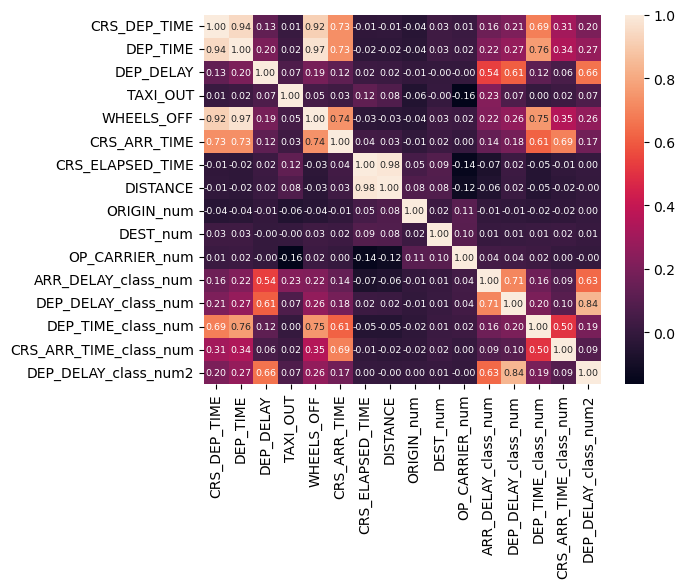

In [48]:
#quitamos variables que no ocupamos
df_sample=df6.sample(frac=0.3)
df_sample=df_sample.drop(columns=["OP_CARRIER_FL_NUM","FL_DATE","ORIGIN","DEST", "OP_CARRIER",\
                                  "ARR_DELAY","ARR_DELAY_class_str",\
                                  "FL_DATE_ts","Busy_class","FL_DATE_month"])
corr_mat_sample = df_sample.corr()
sns.heatmap(corr_mat_sample, annot = True,annot_kws={"size": 6.8},fmt='.2f')
target=df_sample.ARR_DELAY_class_num
X=df_sample.drop('ARR_DELAY_class_num',axis=1)
y=target

#sin negativos
X_nn=df_sample.drop(columns=['ARR_DELAY_class_num','DEP_DELAY'])

#### Reducción de dimensionalidad

Se usa PCA y LDA, que son las técnicas de RD menos costosas.

In [49]:
# Se usa PCA y LDA
X_PCA = PCA(n_components=5).fit_transform(X)
X_LDA = LDA(n_components=2).fit_transform(X,y)


Se grafica la clasificiación obtenida con RD.

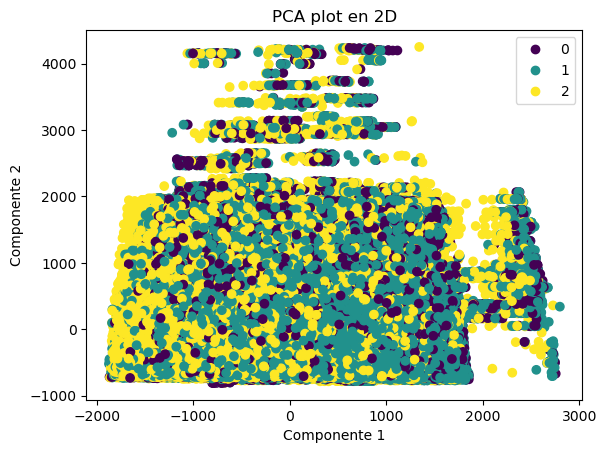

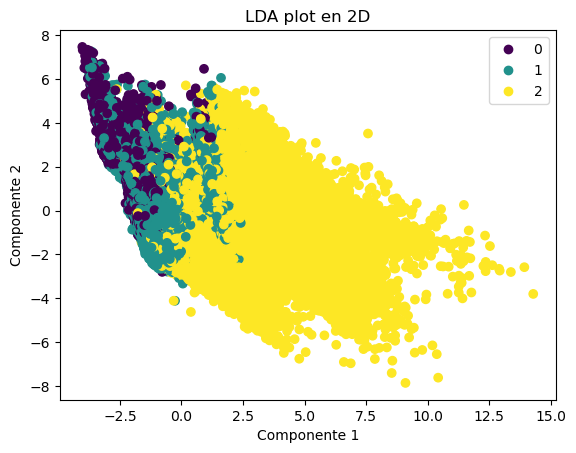

In [50]:
scatter = plt.scatter(X_PCA[:,0], X_PCA[:,1], c=y)
plt.title('PCA plot en 2D')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.legend(*scatter.legend_elements())
plt.show()
scatter = plt.scatter(X_LDA[:,0], X_LDA[:,1], c=y)
plt.title('LDA plot en 2D')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.legend(*scatter.legend_elements())
plt.show()


Se observa una ligera clasifiación con LDA, principalmente de la categoría 2 (Delay) respecto a las demás categorías.

Se crean los datasets de entrenamiento y testing. Modelos como KNN o SVC funcionan mejor con RD, por lo cual se hacen datsets con RD. EL modelo CNB no recibe valores negativos, por lo que se prepara el dataset adecuado.

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_rd, X_test_rd, y_train_rd, y_test_rd = train_test_split(X_LDA, y, test_size=0.2, random_state=42)
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X_nn, y, test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape)

(1076697, 15) (269175, 15)


Se crea función que ejecuta el modelo y calcula la matriz de confusión, el F1 score, la sensibilidad (recall), y la especificidad (TNR).

In [52]:
f1_scores=[]
recall_scores=[]
tnr_global_scores=[]
model_names=[]
cms=[]
times=[]

def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    start_time = time.time()
    model.fit(X_train, y_train)
    end_time = time.time()
    total_time = round(end_time - start_time,4)
    #y_predict_train = model.predict(X_train)
    y_predict_test = model.predict(X_test) 
    #f1_train=f1_score(y_train, y_predict_train, average='macro')
    f1_test=f1_score(y_test, y_predict_test, average='macro')
    # Sensibilidad
    recall_test=recall_score(y_test, y_predict_test, average='macro')
    # Matriz de confusion
    cm= confusion_matrix(y_test, y_predict_test)
    FP = cm.sum(axis=0) - np.diag(cm)  
    FN = cm.sum(axis=1) - np.diag(cm)
    TP = np.diag(cm)
    TN = cm.sum() - (FP + FN + TP)
    
    # Especificidad
    TNR_test= TN/(TN+FP)
    class_counts = np.sum(cm, axis=1)
    TNR_global = np.sum(TNR_test * class_counts) / np.sum(class_counts)

    f1_scores.append(f1_test)
    recall_scores.append(recall_test)
    tnr_global_scores.append(TNR_global)
    model_names.append(model_name)
    cms.append(cm)
    times.append(total_time)

    print(f'Model: {model_name}')
    #print(f'Train f1: {f1_train:.4f}')
    print(f'Test f1: {f1_test:.4f}')
    print(f'Test recall: {recall_test:.4f}')
    print('Test TNR:', TNR_test.round(4))
    print(f'Test TNR (global): {TNR_global:.4f}')
    print("Tiempo de ejecución:",total_time)
    print("")

### Modelos de Clasificación

In [53]:
from sklearn.naive_bayes import GaussianNB,CategoricalNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC


Se hacen las predicciones por modelo

In [54]:
#Naive-Bayes
GNB=GaussianNB()
#C4.5 (Decision Tree)
CDT=DecisionTreeClassifier()
## Con los siuientes modelos se usa reduccion de dimensionalidad
#k-Nearest Neighbors
KNC=KNeighborsClassifier()
# Support Vector Machine
SVC_model=SVC()
# Decision Tree ID3
ID3=DecisionTreeClassifier(criterion='entropy',max_depth=8,splitter='best')
#Logistic regression
LGR = LogisticRegression(solver='liblinear', random_state=0)
#Stochastic Gradient Descent
SGD = SGDClassifier()
# Random Forest Classifier
RFC=RandomForestClassifier()
# Gradient Boosting Classifier
GBC=GradientBoostingClassifier()
#Categorical Naibe-Bayes
CNB=CategoricalNB()

models=[GNB,CDT,KNC,SVC_model,ID3,LGR,SGD,RFC,GBC,CNB]
models_name=['Naive Bayes','C4.5 (Decision Tree)','k-Nearest Neighbors','Support Vector Machine','ID3 (Decision Tree)',\
'Logistic regression','Stochastic Gradient Descent','Random Forest Classifier','Gradient Boosting Classifier','Categorical Naive-Bayes']

for i in range(len(models)):
    # modelos que ocupan RD
    if i in [2,3]:
        if i ==2:
            evaluate_model(models[i], X_train_rd, X_test_rd, y_train_rd, y_test_rd, models_name[i])
        else:
            # Con SVC se ocupan pocos datos por el tiempo que ocupa
            evaluate_model(models[i],X_train_rd[:50000], X_test_rd[:10000], y_train_rd[:50000], y_test_rd[:10000], models_name[i])
    # si el modelo no acepta valores negativos                      
    elif i == 9:
        evaluate_model(models[i], X_train_nn, X_test_nn, y_train_nn, y_test_nn, models_name[i])
    # en los demas casos se utiliza el dataset normal
    else:
        evaluate_model(models[i], X_train, X_test, y_train, y_test, models_name[i])
       
    

Model: Naive Bayes
Test f1: 0.6623
Test recall: 0.6865
Test TNR: [0.8476 0.7882 0.9065]
Test TNR (global): 0.8336
Tiempo de ejecución: 0.1305

Model: C4.5 (Decision Tree)
Test f1: 0.6974
Test recall: 0.6990
Test TNR: [0.9077 0.7427 0.9282]
Test TNR (global): 0.8242
Tiempo de ejecución: 8.1876

Model: k-Nearest Neighbors
Test f1: 0.6745
Test recall: 0.6655
Test TNR: [0.9289 0.6882 0.9406]
Test TNR (global): 0.8014
Tiempo de ejecución: 0.2674

Model: Support Vector Machine
Test f1: 0.6114
Test recall: 0.6216
Test TNR: [0.9881 0.6249 0.9264]
Test TNR (global): 0.7720
Tiempo de ejecución: 15.0054

Model: ID3 (Decision Tree)
Test f1: 0.6766
Test recall: 0.6621
Test TNR: [0.9704 0.6577 0.9629]
Test TNR (global): 0.7978
Tiempo de ejecución: 3.243

Model: Logistic regression
Test f1: 0.6472
Test recall: 0.6459
Test TNR: [0.9873 0.6512 0.9478]
Test TNR (global): 0.7919
Tiempo de ejecución: 36.8842



/Users/vcx/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


Model: Stochastic Gradient Descent
Test f1: 0.6823
Test recall: 0.6791
Test TNR: [0.9225 0.7274 0.9289]
Test TNR (global): 0.8182
Tiempo de ejecución: 246.2361

Model: Random Forest Classifier
Test f1: 0.7394
Test recall: 0.7194
Test TNR: [0.9605 0.7204 0.9651]
Test TNR (global): 0.8312
Tiempo de ejecución: 129.9218

Model: Gradient Boosting Classifier
Test f1: 0.6994
Test recall: 0.6810
Test TNR: [0.9759 0.6777 0.9615]
Test TNR (global): 0.8090
Tiempo de ejecución: 392.0981

Model: Categorical Naive-Bayes
Test f1: 0.6533
Test recall: 0.6523
Test TNR: [0.9186 0.7054 0.9085]
Test TNR (global): 0.7993
Tiempo de ejecución: 0.3104



In [55]:
print("Mejores modelos por f1_score, con tiempo de ejecución")
print("")
index_scores=np.argsort(f1_scores)[::-1]
for i in index_scores:
    print("%s:"%model_names[i], round(f1_scores[i],4), round(times[i],2))

Mejores modelos por f1_score, con tiempo de ejecución

Random Forest Classifier: 0.7394 129.92
Gradient Boosting Classifier: 0.6994 392.1
C4.5 (Decision Tree): 0.6974 8.19
Stochastic Gradient Descent: 0.6823 246.24
ID3 (Decision Tree): 0.6766 3.24
k-Nearest Neighbors: 0.6745 0.27
Naive Bayes: 0.6623 0.13
Categorical Naive-Bayes: 0.6533 0.31
Logistic regression: 0.6472 36.88
Support Vector Machine: 0.6114 15.01


Vemos que el modelo con mejor predicción es Random Forest Classifier (RFC), con un F1-score de 0.739 y con un tiempo de ejecución moderado de 130 segundos. En segundo lugar se encuentra Gradient Boosting Classifier (GBC). No obstante, es el modelo que tomas más tiempo de todos. Seguidamente, C4.5 tiene un F1-score muy cercano a GBC, pero C4.5 toma casi dos ordenes de magnitud menos en tiempo de ejecución, por lo que su uso es más recomendable. En 4to lugar esta Stochastic Gradient Descent, que es tardado, un aspecto a considerar de este modelo es que en fase de prueba se observó que no siempre arroja un buen resultado. En 5to lugar corresponde a ID3, que es bastante eficiente. El sexto mejor modelo es KNN, que si bien el tiempo de ejecución se reduce bastante, el modelo ocupa reducción de dimensionalidad para ser eficiente.
Los modelos clásicos de Naive Bayes (GNB) y Support Vector Machine (SVC) ocupan el 7to y 10mo lugar, respectivamente. Para SVC tiene sentido el resultado, ya que para que no fuera tardado el entrenamiento, se limitó a 50k los datos del X_train y se usó reducción de dimesionalidad. 
En 8vo y 9no lugar estan Logistic regression y Categorical Naive-Bayes, que si bien no arrojan el mejor resultado, el primero muestra un tiempo de ejecución moderadamente rápido, mientrás que el segundo es mucho más eficiente.  

#### *Pruebas de rendimiento de KNN
Debido a que se realizó esta parte de forma posterior a la fase de entrenamiento, se comparte esta parte de la practica mediante Markdown, con una captura de pantalla de los resultados en otra ejecución. Se probaron multiples k: 3,5,7,10,15 y 20. Se observa que el rendimiento usando la mayor k (20) incrementó el rendimiento del modelo hasta ~0.01 repecto al valor por default de k (5) y por ~0.018 respecto a la menor k (3). EL tiempo de ejecución no varia en términos prácticos entre k utilizadas. En el entrenamiento se usó el valor por default de k. En ese entido, haber utilizado un valor de k igual a 20, hubiera mejorado el modelo poniendolo en al menos el 4to lugar, es decir 2 lugares por encima de donde quedó originalmente.
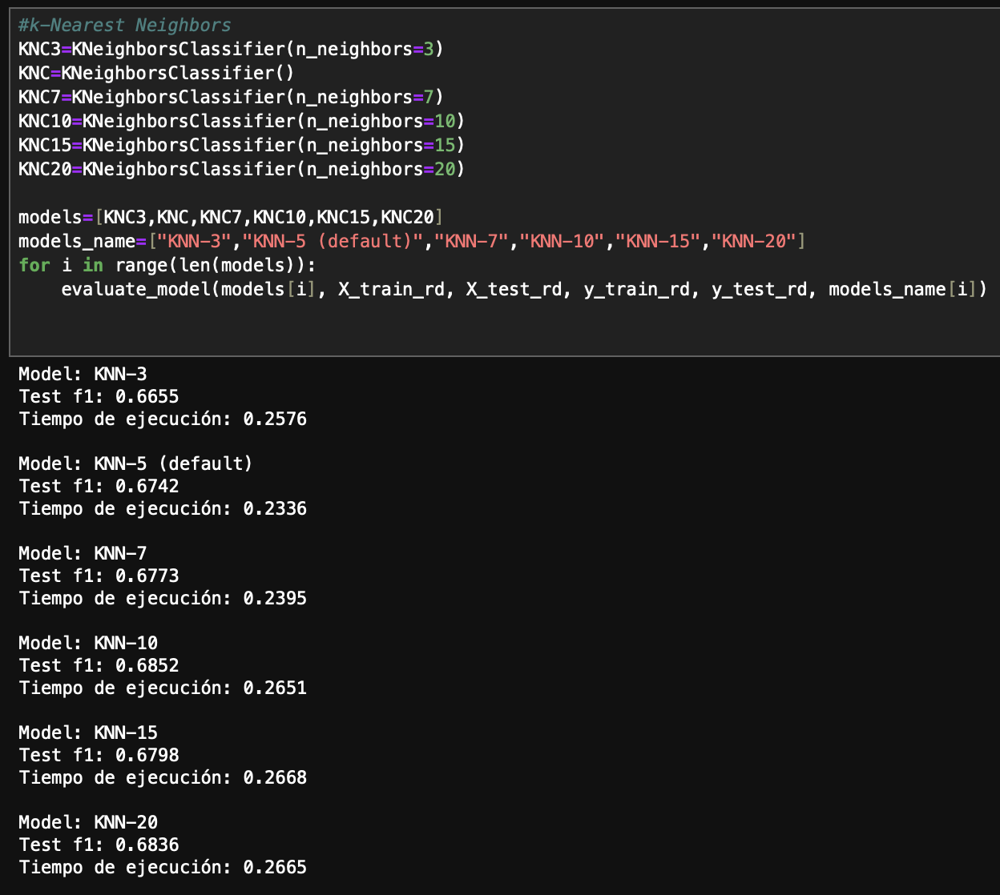

#### Se obtienen las graficas de las matrices de confusión.

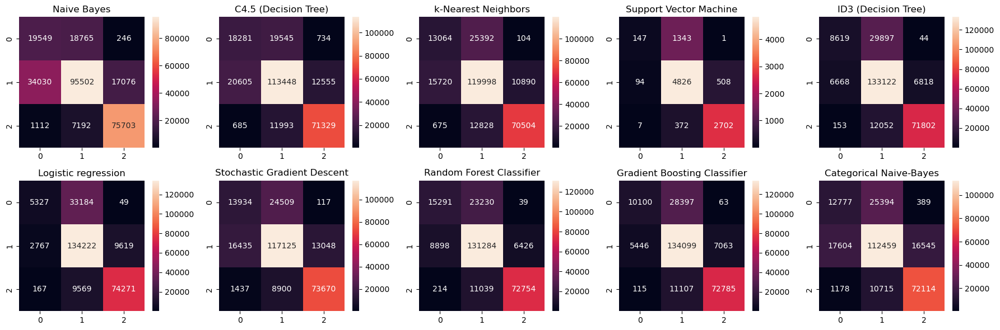

In [56]:
fig = plt.figure(figsize=(18,6))
for i in range(len(cms)):
    plt.subplot(2,5,i+1)
    sns.heatmap(cms[i], annot=True, fmt='.0f')
    plt.title(models_name[i])
plt.tight_layout()

Las matrices de confusción nos muestran que hay muchos Falsos Positivos de la clase 0 (early) con la clase 1 (on time), pero ello no pasa con las clase 2 (retraso). Es decir que al modelo le cuesta distinguir entre las clases 0 y 1.

#### Con los resultados obtenidos en la fase de entrenamiento (preliminar) se decide usar Random Forest Classifier (RFC) para entrenar el train dataset preprocesado (completo) y predecir la variable objetivo usando el dataset de test.

### Procesamiento de dataset de test para evaluar nuestro modelo

Se lee el dataset de test

In [57]:
file_test="test_airlines_delay_challenge.csv"
df_test=pd.read_csv(file_test)
print("columnas:",df.columns.values)
print(df_test)

columnas: ['FL_DATE' 'OP_CARRIER' 'OP_CARRIER_FL_NUM' 'ORIGIN' 'DEST' 'CRS_DEP_TIME'
 'DEP_TIME' 'DEP_DELAY' 'TAXI_OUT' 'WHEELS_OFF' 'CRS_ARR_TIME' 'ARR_DELAY'
 'CRS_ELAPSED_TIME' 'DISTANCE']
            FL_DATE OP_CARRIER  OP_CARRIER_FL_NUM ORIGIN DEST  CRS_DEP_TIME  \
0        2018-07-13         B6                574    TPA  EWR           929   
1        2018-09-11         UA                256    DEN  SFO           750   
2        2018-07-22         WN               3252    AUS  PHX          1710   
3        2018-04-30         AA               1422    BOS  JFK          1440   
4        2018-05-09         WN                187    HOU  ATL           710   
...             ...        ...                ...    ...  ...           ...   
2249995  2018-02-02         WN                201    HOU  CRP           830   
2249996  2018-02-05         UA                508    EWR  IAH           640   
2249997  2018-11-29         OH               5378    LGA  CMH          1411   
2249998  2018-03-1

#### Se crean mismas variables que en el dataset de entrenamiento usando los mismo códigos 

In [58]:
# Para este caso haremos una conversión manual de las etiquetas a integers, para que tanto en el aeropuerto origen y destino se tenga el
# mismo label para cada código
origin_uni=sorted(df_test.ORIGIN.unique())
dest_uni=sorted(df_test.DEST.unique())

print("Número de códigos en origen:",len(origin_uni))
print("Número de códigos en destino:",len(dest_uni))
#la variable origin tiene 352 codigos, mientras que dest 351, vemos si  todos los valores de destino esten en origen
dest_in_ori=np.isin(dest_uni,origin_uni)
# el metodo all te dice si todos los elementos son verdadero, en este caso asi fue
print("Los códigos de origen abarcan a los de destino:", all(dest_in_ori))

origin_num=np.arange(len(origin_uni))
#escogemos origin como nuestro vector base para enumerar nuestros labels
origin_dic={origin_uni[i]:origin_num[i] for i in range(len(origin_uni))}

origin_int=[]
dest_int=[]
for i in range(len(df_test.ORIGIN.values)):
    origin_int.append(origin_dic[df_test.ORIGIN.values[i]])
    dest_int.append(origin_dic[df_test.DEST.values[i]])
origin_int=np.array(origin_int)
dest_int=np.array(dest_int)

# insertamos columna
df_test=df_test.assign(ORIGIN_num=origin_int, DEST_num=dest_int)
df_test.head()

Número de códigos en origen: 357
Número de códigos en destino: 357
Los códigos de origen abarcan a los de destino: True


,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_num,DEST_num
0,2018-07-13,B6,574,TPA,EWR,929,924.0,-5.0,13.0,937.0,1215,166.0,997.0,337,113
1,2018-09-11,UA,256,DEN,SFO,750,750.0,0.0,18.0,808.0,928,158.0,967.0,91,307
2,2018-07-22,WN,3252,AUS,PHX,1710,1820.0,70.0,8.0,1828.0,1730,140.0,872.0,23,261
3,2018-04-30,AA,1422,BOS,JFK,1440,1431.0,-9.0,17.0,1448.0,1607,87.0,187.0,44,178
4,2018-05-09,WN,187,HOU,ATL,710,709.0,-1.0,11.0,720.0,1010,120.0,696.0,153,21


In [59]:
le = LabelEncoder()
op_carrier_num=le.fit_transform(df_test.OP_CARRIER.values)
print(op_carrier_num.shape,df_test.shape)
df_test=df_test.assign(OP_CARRIER_num=op_carrier_num)

(2250000,) (2250000, 15)


In [60]:
df_test['DEP_DELAY_class_num'] = np.select([df_test['DEP_DELAY'] < -15, df_test['DEP_DELAY'] > 15], [0, 2], default=1)
df_test['DEP_TIME_class_num'] = np.select( [(df_test['DEP_TIME'] < 500) & (df_test['DEP_TIME'] > 0),\
(df_test['DEP_TIME'] >= 500) &  (df_test['DEP_TIME'] < 1000)], [0, 1], default=2)
df_test['CRS_ARR_TIME_class_num'] = np.select( [(df_test['CRS_ARR_TIME'] < 500) & (df_test['CRS_ARR_TIME'] > 0),\
(df_test['CRS_ARR_TIME'] >= 500) &  (df_test['CRS_ARR_TIME'] < 1000)], [0, 1], default=2)
df_test['DEP_DELAY_class_num2'] = np.select( [(df_test['DEP_DELAY'].abs() < 5) ,(df_test['DEP_DELAY'].abs() >= 5)\
                                         & (df_test['DEP_DELAY'].abs() < 15),(df_test['DEP_DELAY'].abs() >= 15)\
                                         &  (df_test['DEP_DELAY'].abs() <50)]\
                                       ,[0,1,2,], default=3)

#### Se preparan datasets

In [61]:
#quitamos variables que no ocupamos
df_test2=df_test.drop(columns=["OP_CARRIER_FL_NUM","FL_DATE","ORIGIN","DEST", "OP_CARRIER"])
# se va a entrenar con todos los datos de entrenamiento preprocesados, correspondientes al datset df6
y_train=df6["ARR_DELAY_class_num"]
X_train=df6.drop(columns=["OP_CARRIER_FL_NUM","FL_DATE","ORIGIN","DEST", "OP_CARRIER",\
                                  "ARR_DELAY","ARR_DELAY_class_str",\
                                  "FL_DATE_ts","Busy_class","FL_DATE_month","ARR_DELAY_class_num"])
X_test=df_test2

Se revisa que se tenga las misma columnas entre dataset de entrenamiento y de testing

In [62]:
print("Columnas dataset train")
print(X_train.columns.values)
print("Columnas dataset test")
print(X_test.columns.values)

Columnas dataset train
['CRS_DEP_TIME' 'DEP_TIME' 'DEP_DELAY' 'TAXI_OUT' 'WHEELS_OFF'
 'CRS_ARR_TIME' 'CRS_ELAPSED_TIME' 'DISTANCE' 'ORIGIN_num' 'DEST_num'
 'OP_CARRIER_num' 'DEP_DELAY_class_num' 'DEP_TIME_class_num'
 'CRS_ARR_TIME_class_num' 'DEP_DELAY_class_num2']
Columnas dataset test
['CRS_DEP_TIME' 'DEP_TIME' 'DEP_DELAY' 'TAXI_OUT' 'WHEELS_OFF'
 'CRS_ARR_TIME' 'CRS_ELAPSED_TIME' 'DISTANCE' 'ORIGIN_num' 'DEST_num'
 'OP_CARRIER_num' 'DEP_DELAY_class_num' 'DEP_TIME_class_num'
 'CRS_ARR_TIME_class_num' 'DEP_DELAY_class_num2']


### Se hace entrenamiento final y se predice la variable objetivo con el dataset test

In [63]:
model=RandomForestClassifier()
model.fit(X_train, y_train)
y_predict_test = model.predict(X_test) 

Se guarda en un csv la variable objetivo predecida

In [64]:
y_pred=y_predict_test
y_cat_predict_test=np.where(y_pred == 0, 'Early', np.where(y_pred == 1, 'On time', 'Delay'))
d = {'y_predict': y_cat_predict_test}
df_predict = pd.DataFrame(data=d)
print(df_predict)
df_predict.to_csv('y_predict_vladimir.csv',index=False)

        y_predict
0         On time
1         On time
2           Delay
3           Early
4         On time
...           ...
2249995   On time
2249996   On time
2249997     Early
2249998   On time
2249999   On time

[2250000 rows x 1 columns]


## Conclusiones

En primer lugar, se logró uno de los objetivos de la práctica, que era obtener en la etapa de entrenamiento un buen F1-score con algún modelo de clasificación. En este caso el modelo que mejor resultados obtuvo, fue el de Random Forest Classifier, con un F1-score de 0.738. Para lograr dicho objetivo se hizo una serie de selección y aumento de caraterísticas que permitieron mejorar el rendimiento del modelo.

En segundo lugar, se pudo evaluar el rendimiento de 10 modelos de clasifiación, donde algunos ocuparon Reducción de Dimensionalidad como KNN o Support Vector Machine. Para la evaluación de los modelos se ocuparon las diversas pruebas establecidas para la práctica. Se observó que algunos modelos con menor tiempo de ejecución dieron mejores resultados que modelos más costosos.

Si bien se observó que muchas variables creadas para intentar mejorar el modelo dieron como resultado el efecto contrario. Hubo muchas otras que si mejoraron el rendimiento de los modelos. En ese sentido, se cumplió el objetivo de mejorar los resultados con técnicas vistas en clase.

Respecto a la predicción de la variable objetivo con el test dataset, se esperan resultados igual o menores a los obtenidos con el dataset de entrenamiento.

 